In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import torch
import json
from pathlib import Path
import random
from scipy.interpolate import griddata
from scipy.stats import pearsonr
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error
from skimage.metrics import structural_similarity as ssim
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
import os
import random

# Set style for better plots
plt.style.use('default')
sns.set_palette("husl")

In [ ]:
# Path to your directory
directory = "/mnt/nas05/data01/francesco/progetto_simone/results_30predstep_v3_big_cosine/"

# Get all filenames in the directory
files_gen = os.listdir(os.path.join(directory, 'generated_imgs'))
files_input = os.listdir(os.path.join(directory, 'input_imgs'))
files_gt = os.listdir(os.path.join(directory, 'ground_truth'))


In [18]:
print(f"Found {len(files_gen)} generated files.")
print(f"Found {len(files_input)} input files.")
print(f"Found {len(files_gt)} ground truth files.")

Found 73 generated files.
Found 73 input files.
Found 73 ground truth files.


In [39]:
import numpy as np
import matplotlib.pyplot as plt

def create_polar_plot_data(frame_data):
    """Converts a (24, 360) map into polar coordinates for plotting."""
    lat_bins, lon_bins = frame_data.shape
    theta = np.linspace(0, 2 * np.pi, lon_bins)
    r = np.linspace(0, lat_bins - 1, lat_bins)
    theta_grid, r_grid = np.meshgrid(theta, r)
    return theta_grid, r_grid, frame_data

def plot_all_frames_row(ground_truth, cmap='coolwarm', add_contours=True,
                        figsize_per_frame=4, save_path=None, cbar=False):
    """
    Plot all time frames in one single row of polar subplots.

    Args:
        ground_truth (np.ndarray): shape (1, T, 24, 360) or (T, 24, 360)
        cmap (str): colormap
        add_contours (bool): whether to add contour lines
        figsize_per_frame (float): width per subplot (height auto)
        save_path (str or None): optional path to save the figure
    """
    # --- Revert normalization ---
    ground_truth = ((ground_truth + 1) / 2) * (80000 - (-80000)) + (-80000)

    # Remove batch dimension if present
    if ground_truth.ndim == 4 and ground_truth.shape[0] == 1:
        ground_truth = ground_truth[0]

    num_frames = ground_truth.shape[0]
    print(f"Plotting {num_frames} frames in one row...")

    # Create figure with 1 row and num_frames columns
    fig, axes = plt.subplots(1, num_frames,
                             subplot_kw={'projection': 'polar'},
                             figsize=(figsize_per_frame * num_frames, figsize_per_frame),
                             dpi=200)

    # In case num_frames == 1, make axes iterable
    if num_frames == 1:
        axes = [axes]

    # Plot each frame
    for i, ax in enumerate(axes):
        frame_data = ground_truth[i]
        theta_grid, r_grid, grid_values = create_polar_plot_data(frame_data)

        c = ax.pcolormesh(theta_grid, r_grid, grid_values, shading='auto', cmap=cmap)

        if add_contours:
            levels = np.linspace(grid_values.min(), grid_values.max(), 8)
            ax.contour(theta_grid, r_grid, grid_values, levels=levels,
                       colors='black', linewidths=0.3)

        ax.set_title(f"{i+1}", fontsize=10, pad=10)
        ax.set_theta_zero_location("S")
        ax.set_theta_direction(1)
        ax.grid(False)
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    # Add one colorbar shared across all subplots
    if cbar:
        cbar = fig.colorbar(c, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
        cbar.set_label("Electric Potential Field (V)", fontsize=12)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to: {save_path}")

    plt.show()


In [44]:
random_file = random.randint(0, len(files_gen)-1)

data = np.load(os.path.join(directory, 'generated_imgs', files_gen[random_file]), allow_pickle=True)
data_input = np.load(os.path.join(directory, 'input_imgs', files_input[random_file]), allow_pickle=True)
data_gt = np.load(os.path.join(directory, 'ground_truth', files_gt[random_file]), allow_pickle=True)

Plotting 15 frames in one row...


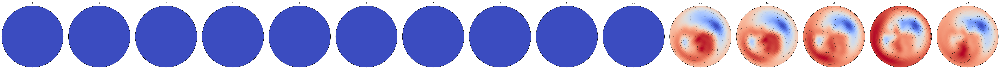

In [45]:
plot_all_frames_row(data_input)

Plotting 15 frames in one row...


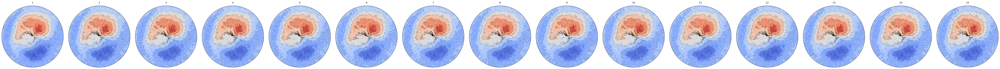

In [42]:
plot_all_frames_row(data)

Plotting 15 frames in one row...


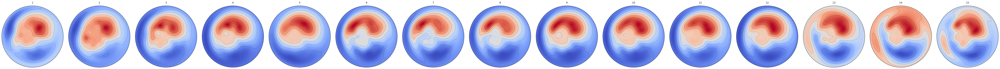

In [43]:
plot_all_frames_row(data_gt)

In [9]:
import sys
sys.path.append('/mnt/nas05/data01/francesco/progetto_simone/ionosphere/')
from src.data.dataset import get_data_objects, get_sequence_data_objects

In [22]:
train_dataset, train_sampler, train_dl = get_sequence_data_objects(
        csv_path="/mnt/nas05/data01/francesco/sdo_img2img/sde_mag2mag_v2/progetto_simone/data/l1_earth_associated_with_maps.csv",
        transform_cond_csv="/mnt/nas05/data01/francesco/sdo_img2img/sde_mag2mag_v2/progetto_simone/data/params.csv",
        batch_size=1,
        distributed=False,
        num_data_workers=1,
        split='train',
        seed=85,
        sequence_length=30,
        normalization_type="absolute_max",
        use_l1_conditions=True,
        min_center_distance=5,
        cartesian_transform=False,  # Convert to Cartesian circular grid
        output_size=224,  # Output grid size for Cartesian transform
    )


In [23]:
it = iter(train_dl)
batch = next(it)
cond_img, cond_label = batch

Plotting 15 frames in one row...


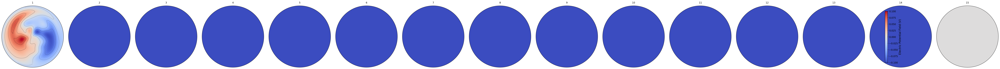

In [24]:
plot_all_frames_row(cond_img[0, 15:, 0, :, :].cpu().numpy())  # Plot only the predicted frames

Plotting 15 frames in one row...


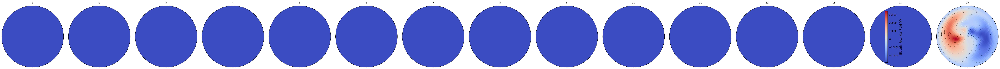

In [25]:
plot_all_frames_row(cond_img[0, :15, 0, :, :].cpu().numpy())  # Plot only the predicted frames